<center><h1>SaRLVision Environment Self-Explainability</h1>
<h2>Matthias Bartolo</h2>

</center>

**<h3> Package Imports </h3>**

In [1]:
import SaRLVision as srlv
import gymnasium as gym

from SaRLVision.utils import *
from SaRLVision.agents import *

CUDA is available! Using GPU for computations.


**<h3> Defining Classes </h3>**

In [2]:
classes = ['cat', 'bird', 'motorbike', 'diningtable', 'train', 'tvmonitor', 'bus', 'horse', 'car', 'pottedplant', 'person', 'chair', 'boat', 'bottle', 'bicycle', 'dog', 'aeroplane', 'cow', 'sheep', 'sofa']
print(classes)
print('\033[93m' + 'Number of classes: ' + '\033[0m' + str(len(classes)))

['cat', 'bird', 'motorbike', 'diningtable', 'train', 'tvmonitor', 'bus', 'horse', 'car', 'pottedplant', 'person', 'chair', 'boat', 'bottle', 'bicycle', 'dog', 'aeroplane', 'cow', 'sheep', 'sofa']
Number of classes: 20


**<h3> Environment Creation </h3>**

**<h4> Render modes </h4>**
- `human`: Displays the environment with the current bounding box and action being taken by the agent.
- `trigger_image`: Displays the environment with the current bounding box and action being taken by the agent, as well as the `Inhibition of Return (IOR)` trigger mark.
- `bbox`: Displays the environment with the current bounding box and action being taken by the agent, without the image as the background.
- `rgb_array`: Returns the current frame of the environment as a numpy array.
- `None`: No rendering is done.

`Note`: In the environment, training mode, the ground truth bounding boxes and training information is also displayed. To change modes: `env.train()`, `env.eval()` and `env.test()`.

**<h4> Explicit Training </h4>**
- 'dqn_agent.explicit_train()': Trains the agent using the explicit training method. This method enhances the original training method by adding the funcitonality to display and retrieve an `action log` for the agent, which is paramount for algorithmic transparency and self-explainability.

In [3]:
# Defining render modes
render_modes = ['human', 'trigger_image', 'bbox', None]

# Defining the current render mode
current_render_mode = render_modes[0]

# Selecting class
current_class = classes[18]

# Setting the environment configuration
env_config = {'dataset': '../Datasets/PascalVOC2007Dataset',
            'dataset_year': '2007',
            'dataset_image_set': 'test',
            'feature_extractor': VGG16FeatureExtractor(), 
            'target_size': VGG16_TARGET_SIZE,
            'current_class': current_class,
            'use_sara': False,
            'render_mode': current_render_mode,
            'allow_classification': True,
            'threshold': 0.5,
            }

# Creating the environment
env = gym.make('DetectionEnv-v0-View', env_config=env_config)

# Setting name
name = "Explicit DQN Agent"

# Creating the Replay_Buffer
replay_buffer = Replay_Buffer(env)

# Creating the DQN agent
dqn_agent = DQNAgent(env, replay_buffer, name=name, exploration_mode=GUIDED_EXPLORE)

# Setting the display_every_n_episodes to 1 (Adjust accordingly)
dqn_agent.display_every_n_episodes = 1

# Explicitly training the agent
action_log = dqn_agent.explicit_train(decode=True)

# Retrieving the episode info
dqn_episode_info = dqn_agent.get_episode_info()

# Printing the time taken to train the agent
print("Time taken to train the agent: {:.2f} seconds".format(dqn_episode_info["eps_duration"]))

# Saving the model
dqn_agent.save(path="evaluation_models/" + name + '/' + current_class)

# Setting the epsilon to 0
dqn_agent.epsilon = 0.0


Using downloaded and verified file: ../Datasets/PascalVOC2007Dataset\VOCtest_06-Nov-2007.tar
Extracting ../Datasets/PascalVOC2007Dataset\VOCtest_06-Nov-2007.tar to ../Datasets/PascalVOC2007Dataset
Dataset loaded successfully.
Total number of classes in the dataset: 20
Total number of images in the dataset: 7632
Current Class: sheep
8: Trigger T
Episode: 1 Epsilon: 1.00 Average Reward: 5.123666038920276 Episode Length: 0 Average IoU: 0.54 Average Recall: 0.56 Epochs: 0 Final IoU: 0.54
----------------------------------------------------------------------------------------------------
Action: Make smaller -
Action: Move down ↓
Action: Move down ↓
8: Trigger T
Episode: 2 Epsilon: 1.00 Average Reward: 6.304403227585195 Episode Length: 4 Average IoU: 0.60 Average Recall: 0.70 Epochs: 0 Final IoU: 0.55
----------------------------------------------------------------------------------------------------
8: Trigger T
Episode: 3 Epsilon: 1.00 Average Reward: 5.241506609046485 Episode Length: 1 A

**<h3> Displaying Action Log </h3>**

In [4]:
print(action_log)

{0: [(8, 'Trigger')], 1: [(5, 'Make smaller'), (3, 'Move down'), (3, 'Move down'), (8, 'Trigger')], 2: [(8, 'Trigger')], 3: [(6, 'Make fatter'), (7, 'Make taller'), (1, 'Move left'), (5, 'Make smaller'), (6, 'Make fatter'), (1, 'Move left'), (3, 'Move down'), (5, 'Make smaller'), (4, 'Make bigger'), (3, 'Move down'), (3, 'Move down'), (3, 'Move down'), (8, 'Trigger')], 4: [(7, 'Make taller'), (5, 'Make smaller'), (3, 'Move down'), (4, 'Make bigger'), (7, 'Make taller'), (0, 'Move right'), (8, 'Trigger')], 5: [(6, 'Make fatter'), (6, 'Make fatter'), (0, 'Move right'), (3, 'Move down'), (5, 'Make smaller'), (0, 'Move right'), (5, 'Make smaller'), (8, 'Trigger')], 6: [(0, 'Move right'), (7, 'Make taller'), (3, 'Move down'), (5, 'Make smaller'), (2, 'Move up'), (8, 'Trigger')], 7: [(2, 'Move up'), (3, 'Move down'), (0, 'Move right'), (2, 'Move up'), (0, 'Move right'), (7, 'Make taller'), (5, 'Make smaller'), (8, 'Trigger')], 8: [(5, 'Make smaller'), (5, 'Make smaller'), (7, 'Make taller'),

**<h3> Displaying Action Space </h3>**

In [5]:
env.get_actions()

Actions:
0: Move right → 
1: Move left ←
2: Move up ↑
3: Move down ↓
4: Make bigger +
5: Make smaller -
6: Make fatter W
7: Make taller H
8: Trigger T


**<h3> Reinforcement Learning Interaction Loop with Display method </h3>**

**<h4> Display modes </h4>**
- `image`: Displays the environment with the current bounding box and action being taken by the agent.
- `trigger_image`: Displays the environment with the current bounding box and action being taken by the agent, as well as the `Inhibition of Return (IOR)` trigger mark.
- `bbox`: Displays the environment with the current bounding box and action being taken by the agent, without the image as the background.
- `heatmap`: Displays the environment with the current bounding box and action being taken by the agent, in the form of a heatmap (similar to the bbox mode).
- `detection`: Displays the environment with the current bounding box and action being taken by the agent, as well as the class label of the object being detected.
- `None`: No rendering is done.

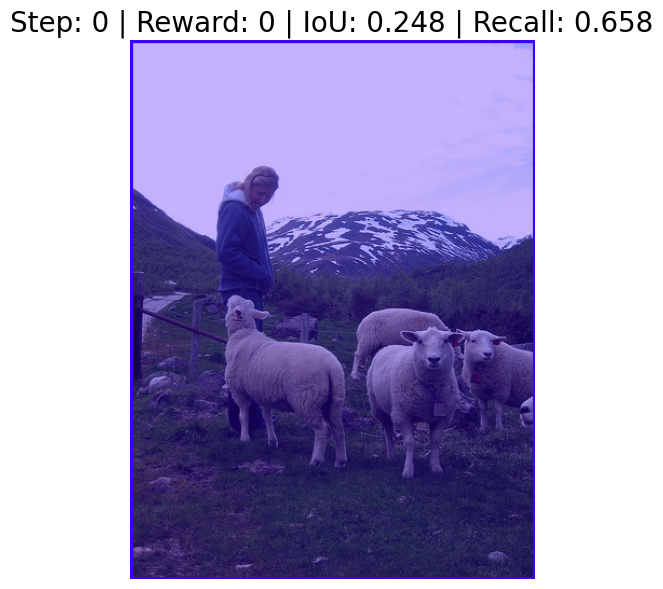

Action: Make fatter W


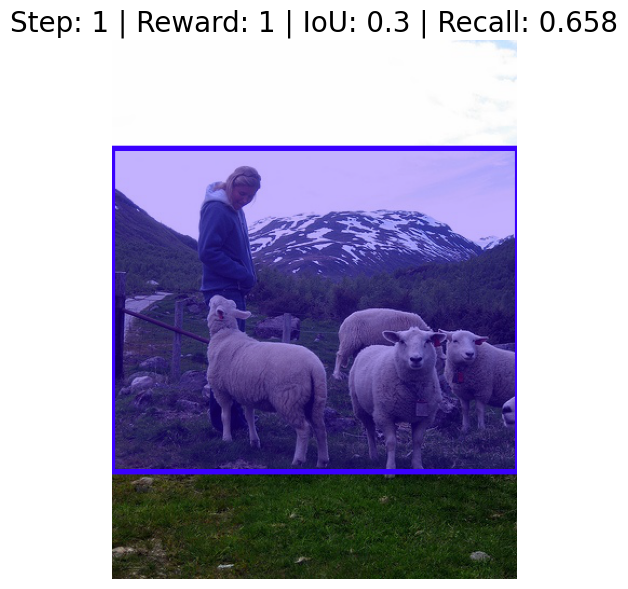

Action: Make taller H


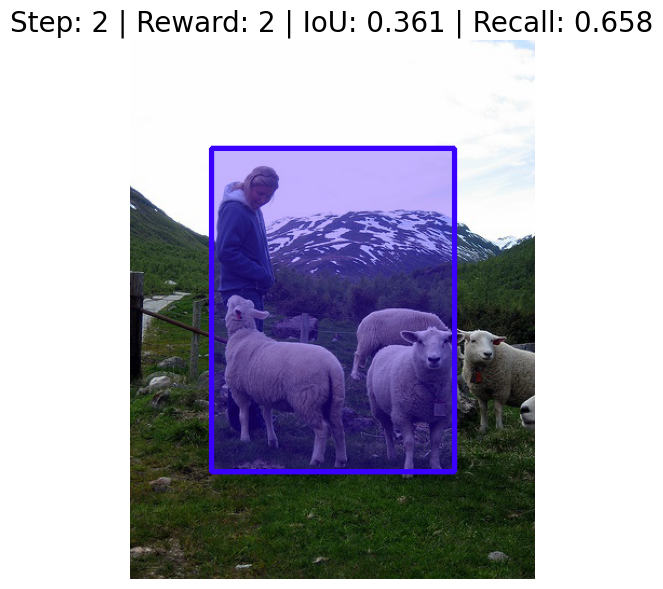

Action: Make fatter W


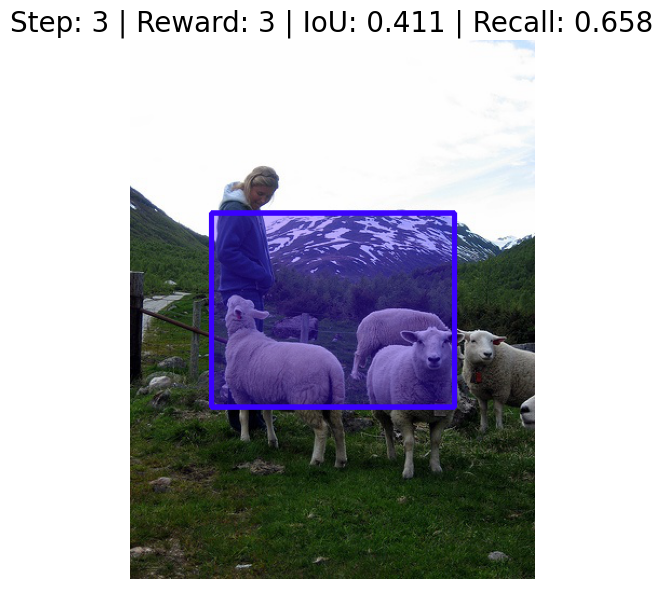

Action: Make fatter W


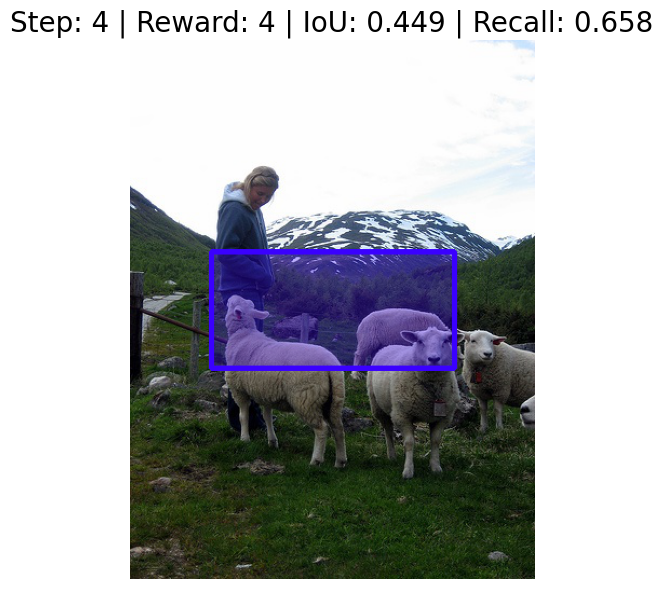

Action: Make fatter W


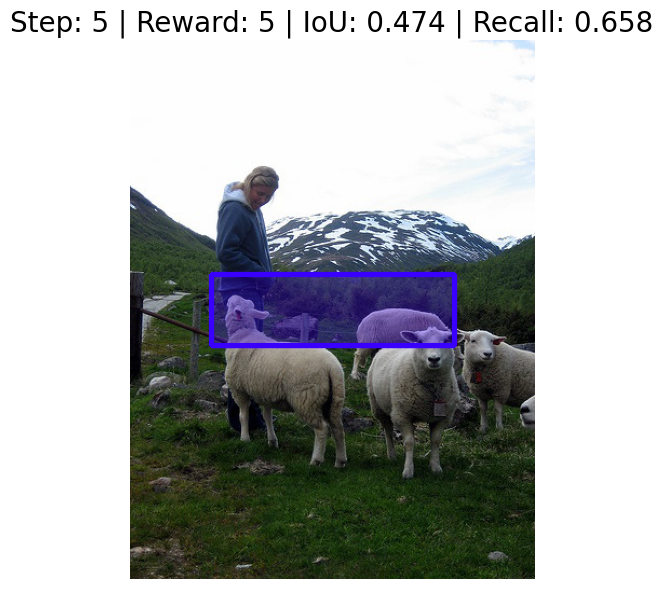

Action: Make taller H


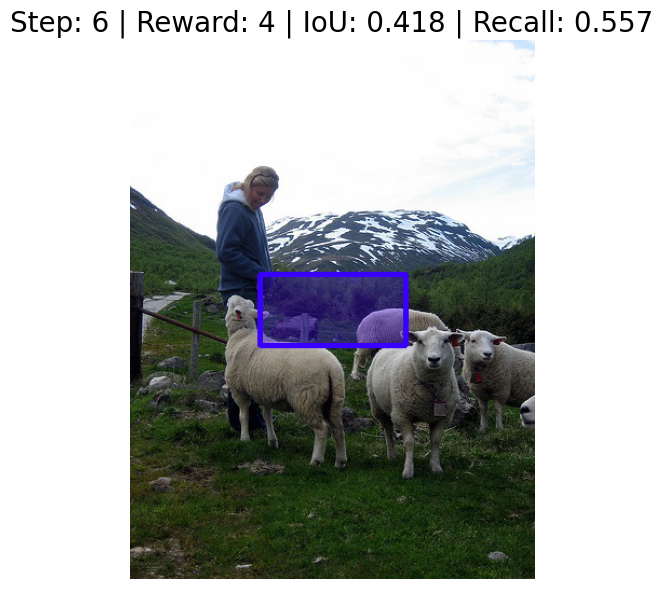

Action: Make fatter W


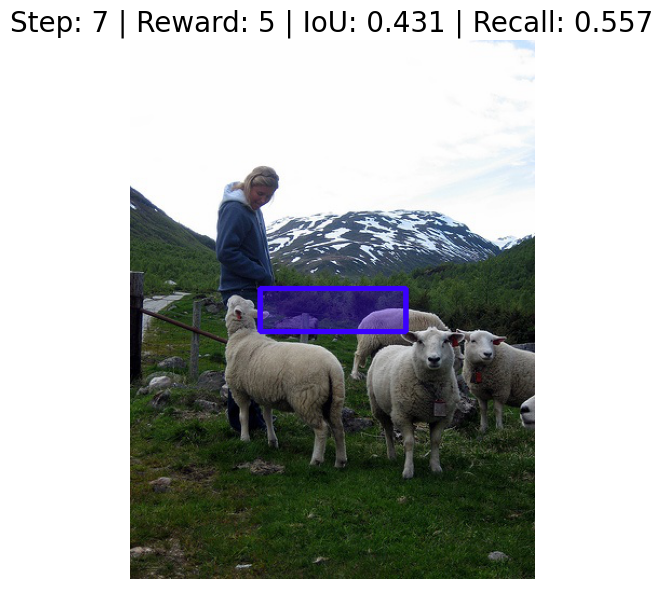

Action: Move right →


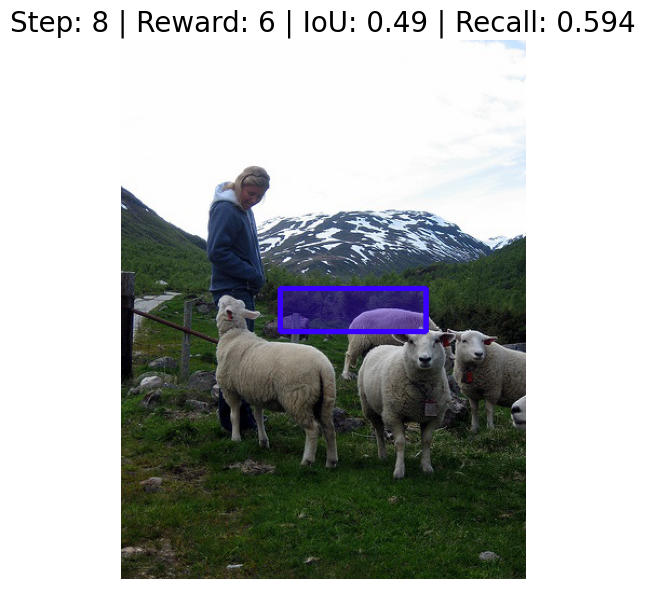

Action: Make fatter W


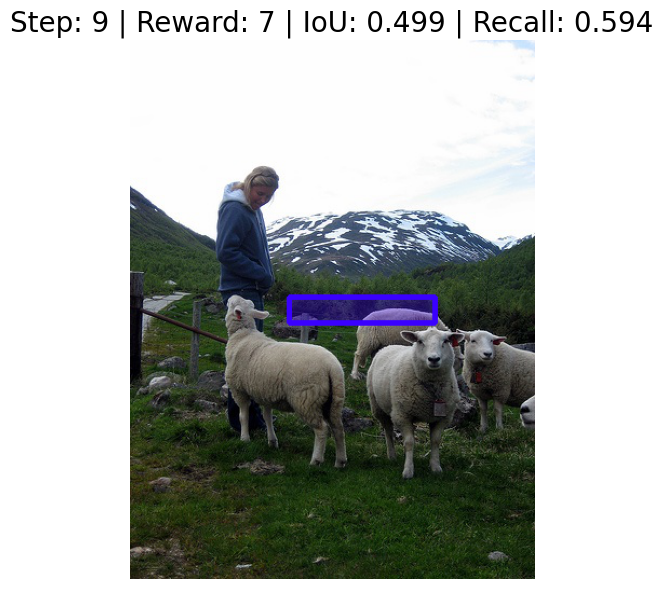

Action: Move left ←


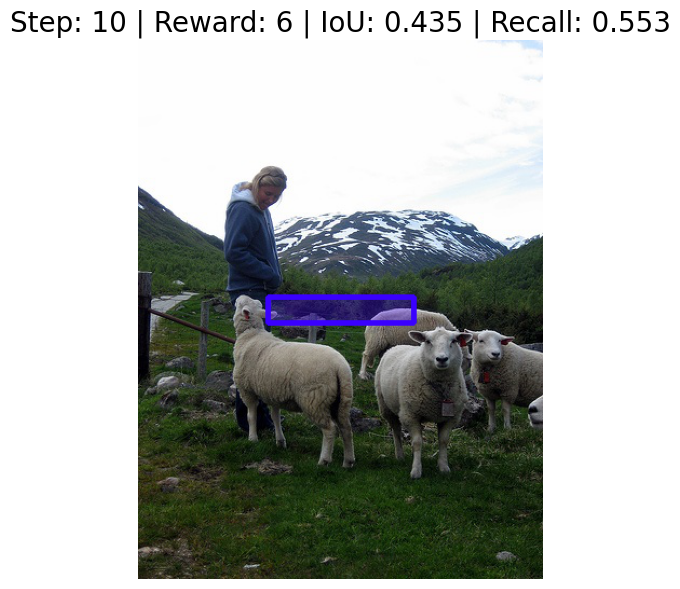

Action: Make fatter W


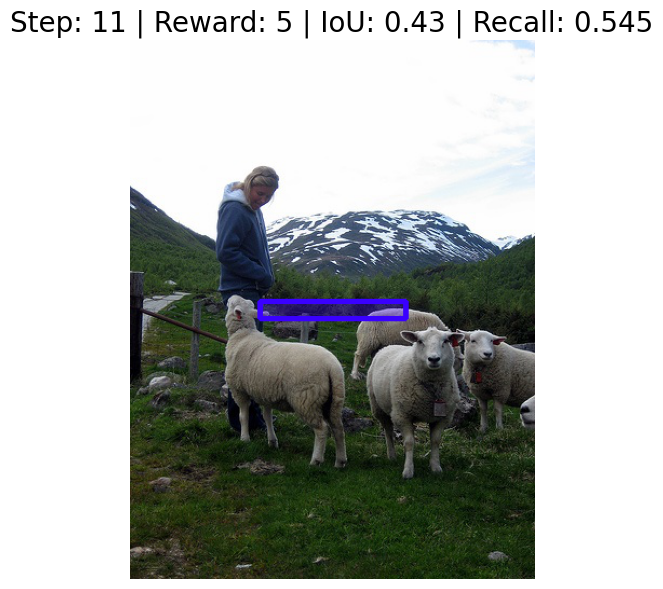

Action: Make fatter W


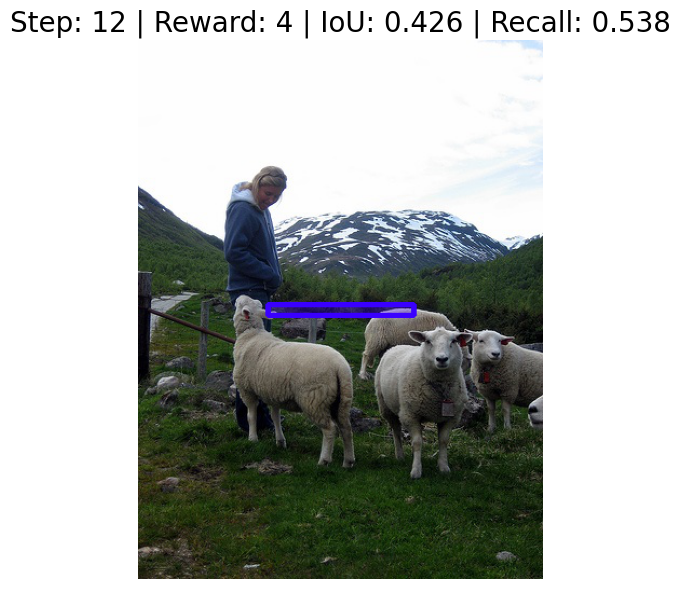

Action: Make fatter W


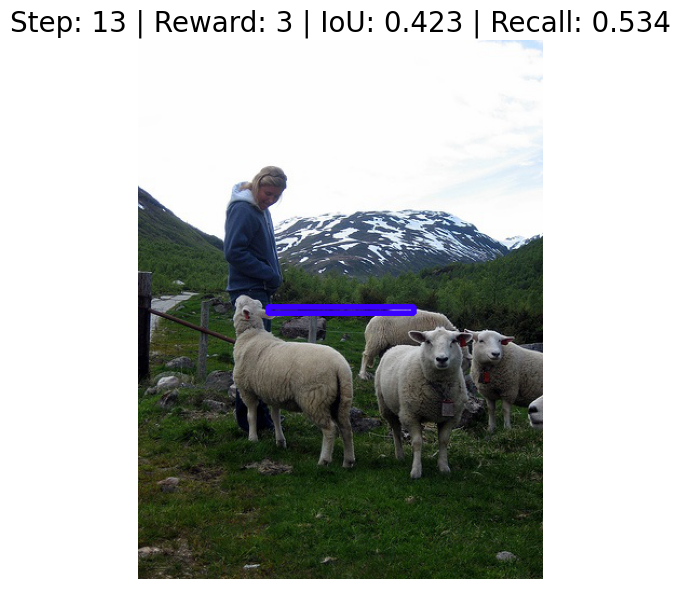

Action: Move right →


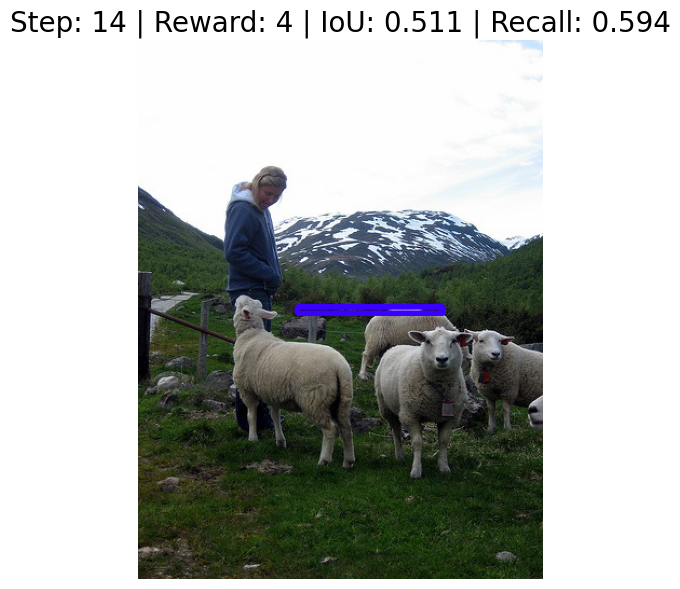

Action: Move down ↓


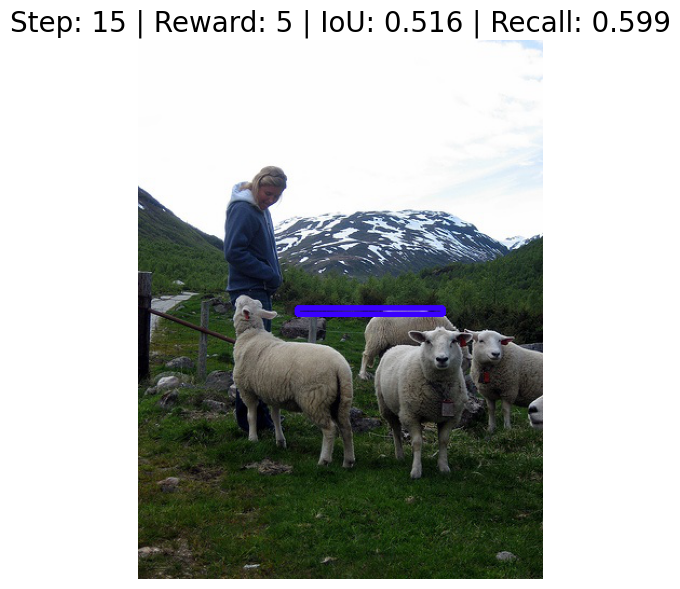

Action: Move down ↓


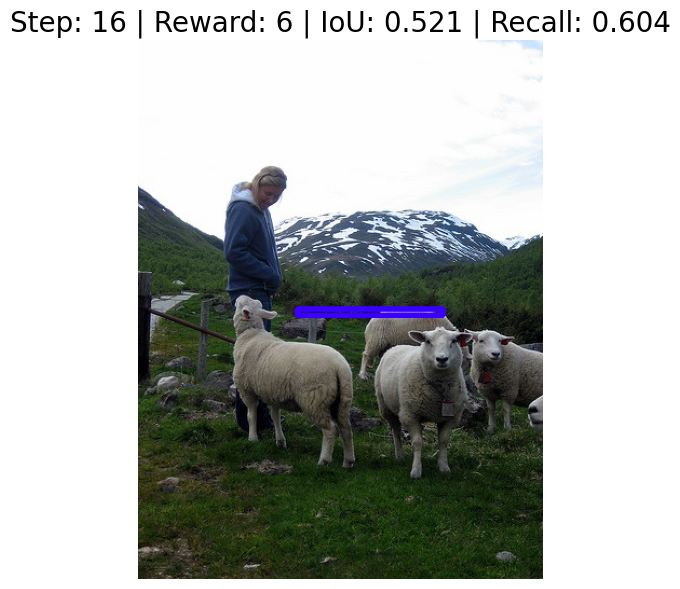

Action: Move down ↓


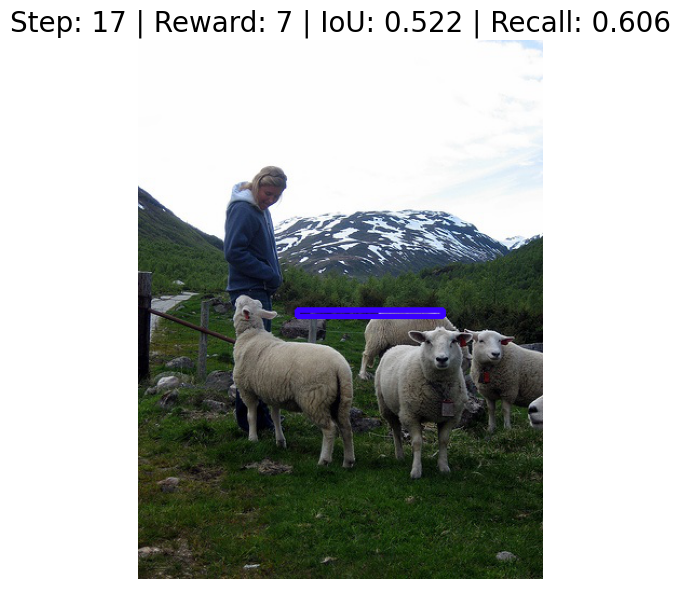

Action: Move down ↓


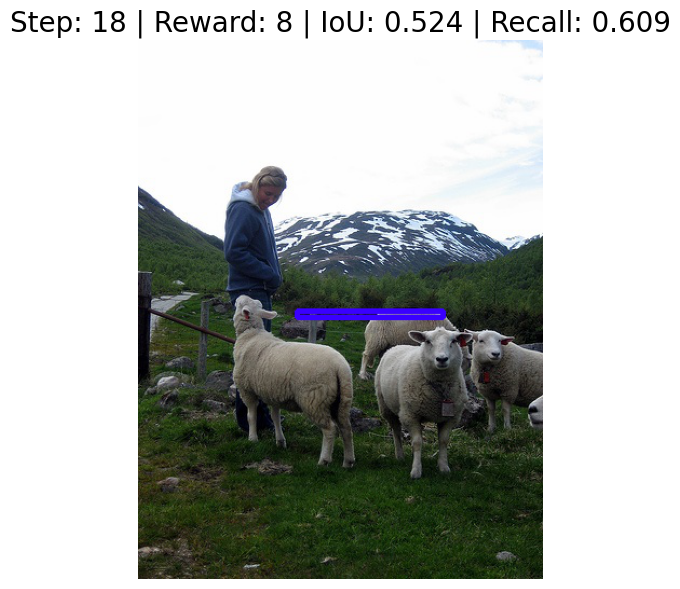

8: Trigger T


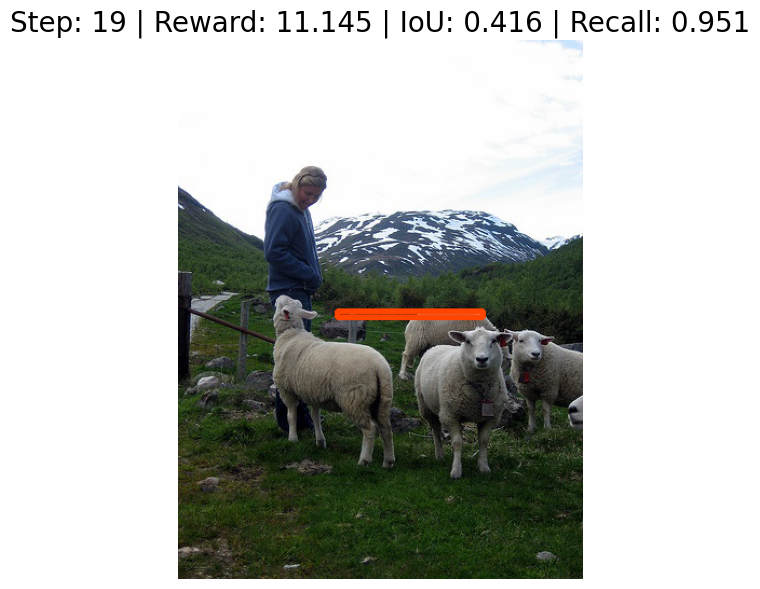

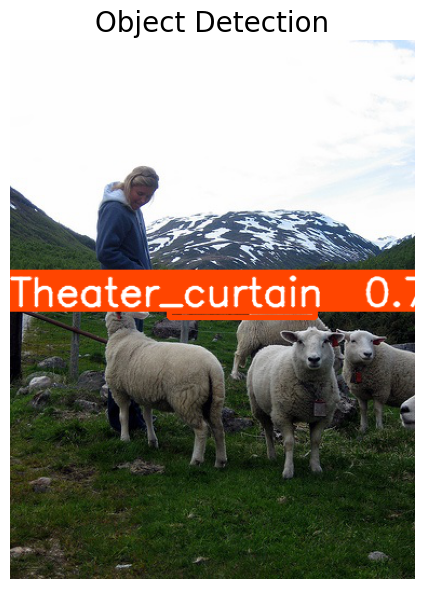

In [6]:
# Defining the display modes
display_modes = ['image', 'trigger_image', 'bbox', 'detection', 'heatmap', None]

# Setting the current display mode
current_display_mode = display_modes[0]

# Possibility to change the classification network
env_config= {'classifier': ResNet50V2(),'classifier_target_size': RESNET50_TARGET_SIZE}
env.reset(env_config=env_config)

# Displaying the environment
env.display(do_display=True, mode=current_display_mode)

# Retrieving the current state
state = env.get_state()

# Declaring terminated and truncated
terminated = truncated = False

# RL Interaction Loop
while True:
    # Selecting the action
    action = dqn_agent.select_action(state)

    # Taking the action
    next_state, _, terminated, truncated, info = env.step(action)

    # Printing the current action
    env.decode_action(action)

    # Setting done
    done = truncated or terminated

    # Updating the state
    state = next_state

    # Displaying the environment
    img = env.display(do_display=True, mode=current_display_mode)
    
    # Checking if done
    if done:
        break

# Predicting class Label
prediction = env.predict(do_display=True, do_save=False, save_path=None)

**<h3> Closing Environment </h3>**

In [7]:
env.close()